In [1]:
import os
os.environ["PYTHONWARNINGS"] = "ignore"

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [24]:
import scanpy as sc
import hotspot as hp
import numpy as np
import matplotlib.pyplot as plt

In [4]:
sc.settings.set_figure_params(frameon=False, vector_friendly=True)
sc.settings._vector_friendly = False
sc.settings.verbosity = 2

In [5]:
# set working directory
project_dir = os.path.expanduser("~/BreastCancerG0arrest/")
working_dir = project_dir + "00_revisions/"
os.chdir(working_dir)

# set figure directory
figure_dir = working_dir + "figures/"

# results  directory
results_dir = working_dir + "results/"

# data directory
data_dir = working_dir + "data/"

In [6]:
adata_full = sc.read_h5ad(data_dir + "adata_full_harmony_integration.h5ad")

In [8]:
adata_malignant = adata_full[adata_full.obs["malignancy"] == "malignant"].copy()

In [9]:
adata_invasive = adata_malignant[~adata_malignant.obs["type"].isin(["neoplasm", "DCIS"])].copy()

## G0 arrested

In [10]:
state = "G0-arrested"

In [11]:
adata = adata_invasive[adata_invasive.obs.cycling_state_oren.isin([state])].copy()

In [12]:
adata.X = adata.layers["counts"].copy()
sc.pp.filter_genes(adata, min_cells=20)

filtered out 6507 genes that are detected in less than 20 cells


In [13]:
sc.pp.normalize_total(adata, target_sum=1e4)
adata.X = np.log1p(adata.X)

normalizing counts per cell
    finished (0:00:00)


In [14]:
sc.pp.highly_variable_genes(adata, batch_key="type", n_top_genes=2000)
sc.pp.pca(adata, use_highly_variable=True)

extracting highly variable genes
    finished (0:00:01)
computing PCA
    with n_comps=50
    finished (0:00:00)


In [15]:
sc.external.pp.harmony_integrate(adata, key=["patient"])

2026-01-12 10:14:39,886 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2026-01-12 10:14:40,811 - harmonypy - INFO - sklearn.KMeans initialization complete.
2026-01-12 10:14:40,848 - harmonypy - INFO - Iteration 1 of 10
2026-01-12 10:14:43,226 - harmonypy - INFO - Iteration 2 of 10
2026-01-12 10:14:45,323 - harmonypy - INFO - Iteration 3 of 10
2026-01-12 10:14:47,423 - harmonypy - INFO - Converged after 3 iterations


In [16]:
sc.pp.neighbors(adata, use_rep="X_pca_harmony")

computing neighbors
    finished (0:00:02)


In [17]:
hs = hp.Hotspot(
    adata,
    distances_obsp_key="distances",
    layer_key="counts",
    umi_counts_obs_key="nCount_RNA",
)

In [18]:
hs.create_knn_graph(
    weighted_graph=False,
    n_neighbors=30,
)

In [19]:
hs_results = hs.compute_autocorrelations(jobs=32)

100%|██████████| 17392/17392 [05:33<00:00, 52.22it/s]


In [20]:
hs_results.head(15)

,C,Z,Pval,FDR
Gene,,,,
DDIT4,0.659722,411.402290,0.0,0.0
MYH11,0.490226,386.993495,0.0,0.0
SPRR2A,0.548756,363.329477,0.0,0.0
ID1,0.530905,358.584300,0.0,0.0
KRT14,0.599672,349.475429,0.0,0.0
SPRR2D,0.456033,334.750821,0.0,0.0
RPLP1,0.728342,322.370485,0.0,0.0
JUNB,0.618141,310.850403,0.0,0.0
MT2A,0.414162,310.101627,0.0,0.0


In [21]:
# Select the genes with significant lineage autocorrelation
hs_genes = (
    hs_results.loc[hs_results.FDR < 0.05]
    .sort_values("Z", ascending=False)
    .head(500)
    .index
)

# Compute pair-wise local correlations between these genes
lcz = hs.compute_local_correlations(hs_genes, jobs=10)

Computing pair-wise local correlation on 500 features...


100%|██████████| 124750/124750 [00:07<00:00, 17195.56it/s]


In [22]:
modules = hs.create_modules(min_gene_threshold=15, core_only=True, fdr_threshold=0.05)
modules.value_counts()

Module
 1     130
-1      86
 4      52
 2      39
 10     36
 3      35
 11     30
 6      21
 5      20
 7      18
 8      17
 9      16
Name: count, dtype: int64

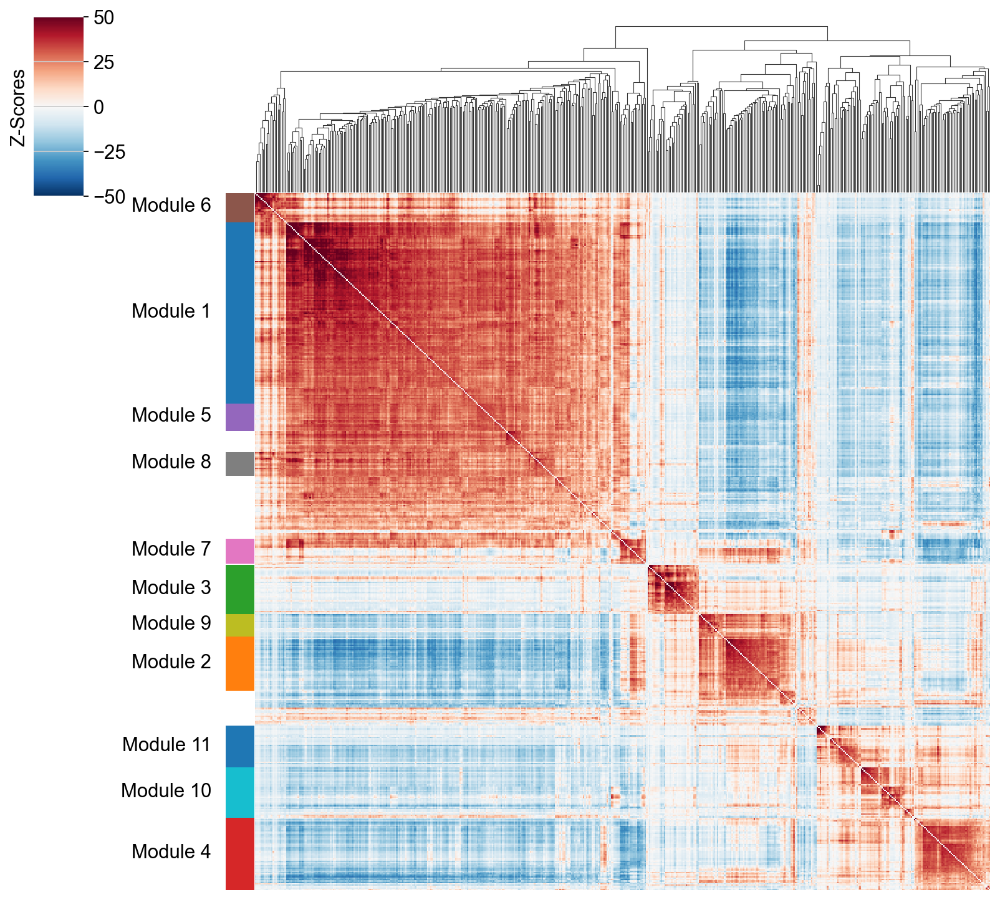

In [26]:
hs.plot_local_correlations(vmin=-50, vmax=50)
plt.savefig(figure_dir + "hotspot_local_correlations_g0arrested_invasive.pdf")

In [27]:
results = hs.results.join(hs.modules)
# order by module
results = results.sort_values("Module")
# save results
results.to_csv(results_dir + f"hotspot_{state}_modules.csv")

In [28]:
module_scores = hs.calculate_module_scores()
module_scores.head()

Computing scores for 11 modules...


100%|██████████| 11/11 [00:01<00:00,  8.53it/s]


,1,2,3,4,5,6,7,8,9,10,11
Gao2021_AAAGATGCAGTTTACG,-3.343473,-1.850500,-0.261432,-0.910906,0.453250,-1.441741,-1.599037,-0.609085,-0.996733,-1.111186,-0.934666
Gao2021_AACCGCGCACCTATCC,-5.419317,-2.535487,-0.860233,-0.606532,-2.042879,-1.491492,-3.352210,-1.002856,-0.455118,-1.697574,-1.075648
Gao2021_AACTCCCCAGCAGTTT,-5.121605,-4.102610,0.423325,-0.301654,-1.498624,-1.524506,-4.786695,-0.918688,-0.469793,-1.914520,-0.928589
Gao2021_AATCGGTTCGCATGGC,-5.122491,-3.500781,-0.013850,-0.362488,-1.329221,-1.518158,-4.256344,-1.144986,-0.484328,-1.667260,-0.903824
Gao2021_ACCAGTATCGTAGGAG,-4.556771,-2.915197,0.015252,-1.104784,-0.691001,-1.114710,-2.774941,1.526489,-0.894347,-1.426323,-1.129540


In [29]:
sc.tl.umap(adata)

computing UMAP
    finished (0:00:13)


In [30]:
module_cols = []
for c in module_scores.columns:
    key = f"Module {c}"
    adata.obs[key] = module_scores[c]
    module_cols.append(key)

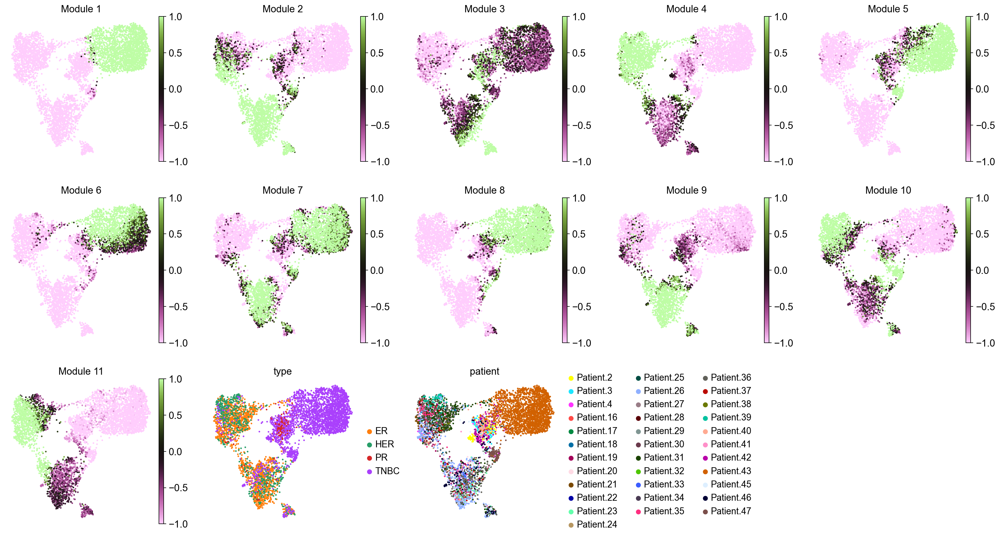

In [31]:
sc.pl.umap(adata, color=module_cols + ["type", "patient"], vmin=-1, vmax=1, cmap="vanimo", ncols=5)

## Fast-cycling

In [32]:
state = "Fast-cycling"

In [33]:
adata = adata_invasive[adata_invasive.obs.cycling_state_oren.isin([state])].copy()

In [34]:
adata.X = adata.layers["counts"].copy()
sc.pp.filter_genes(adata, min_cells=20)

filtered out 3718 genes that are detected in less than 20 cells


In [35]:
sc.pp.normalize_total(adata, target_sum=1e4)
adata.X = np.log1p(adata.X)

normalizing counts per cell
    finished (0:00:00)


In [36]:
sc.pp.highly_variable_genes(adata, batch_key="type", n_top_genes=2000)
sc.pp.pca(adata, use_highly_variable=True)

extracting highly variable genes
    finished (0:00:03)
computing PCA
    with n_comps=50
    finished (0:00:02)


In [37]:
sc.external.pp.harmony_integrate(adata, key=["patient"])

2026-01-12 10:24:27,065 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2026-01-12 10:24:30,165 - harmonypy - INFO - sklearn.KMeans initialization complete.
2026-01-12 10:24:30,333 - harmonypy - INFO - Iteration 1 of 10
2026-01-12 10:24:40,783 - harmonypy - INFO - Iteration 2 of 10
2026-01-12 10:24:50,528 - harmonypy - INFO - Converged after 2 iterations


In [38]:
sc.pp.neighbors(adata, use_rep="X_pca_harmony")

computing neighbors
    finished (0:00:26)


In [39]:
hs = hp.Hotspot(
    adata,
    distances_obsp_key="distances",
    layer_key="counts",
    umi_counts_obs_key="nCount_RNA",
)

In [40]:
hs.create_knn_graph(
    weighted_graph=False,
    n_neighbors=30,
)

In [41]:
hs_results = hs.compute_autocorrelations(jobs=32)

100%|██████████| 20181/20181 [22:44<00:00, 14.79it/s]


In [42]:
hs_results.head(15)

,C,Z,Pval,FDR
Gene,,,,
APOE,0.561721,866.332703,0.0,0.0
SCGB1D2,0.402548,777.277405,0.0,0.0
PTN,0.508510,681.563965,0.0,0.0
DDIT4,0.657560,671.415649,0.0,0.0
COL17A1,0.459891,665.163879,0.0,0.0
TSHZ2,0.484383,651.355408,0.0,0.0
CXCL13,0.335730,624.229004,0.0,0.0
CXCL14,0.557607,614.103577,0.0,0.0
C2orf40,0.489696,601.358276,0.0,0.0


In [43]:
# Select the genes with significant lineage autocorrelation
hs_genes = (
    hs_results.loc[hs_results.FDR < 0.05]
    .sort_values("Z", ascending=False)
    .head(500)
    .index
)

# Compute pair-wise local correlations between these genes
lcz = hs.compute_local_correlations(hs_genes, jobs=10)

Computing pair-wise local correlation on 500 features...


100%|██████████| 124750/124750 [00:18<00:00, 6784.39it/s]


In [44]:
modules = hs.create_modules(min_gene_threshold=15, core_only=True, fdr_threshold=0.05)
modules.value_counts()

Module
-1     91
 5     55
 8     54
 1     43
 7     29
 6     27
 12    25
 15    22
 10    22
 2     22
 11    21
 4     20
 14    19
 9     18
 3     16
 13    16
Name: count, dtype: int64

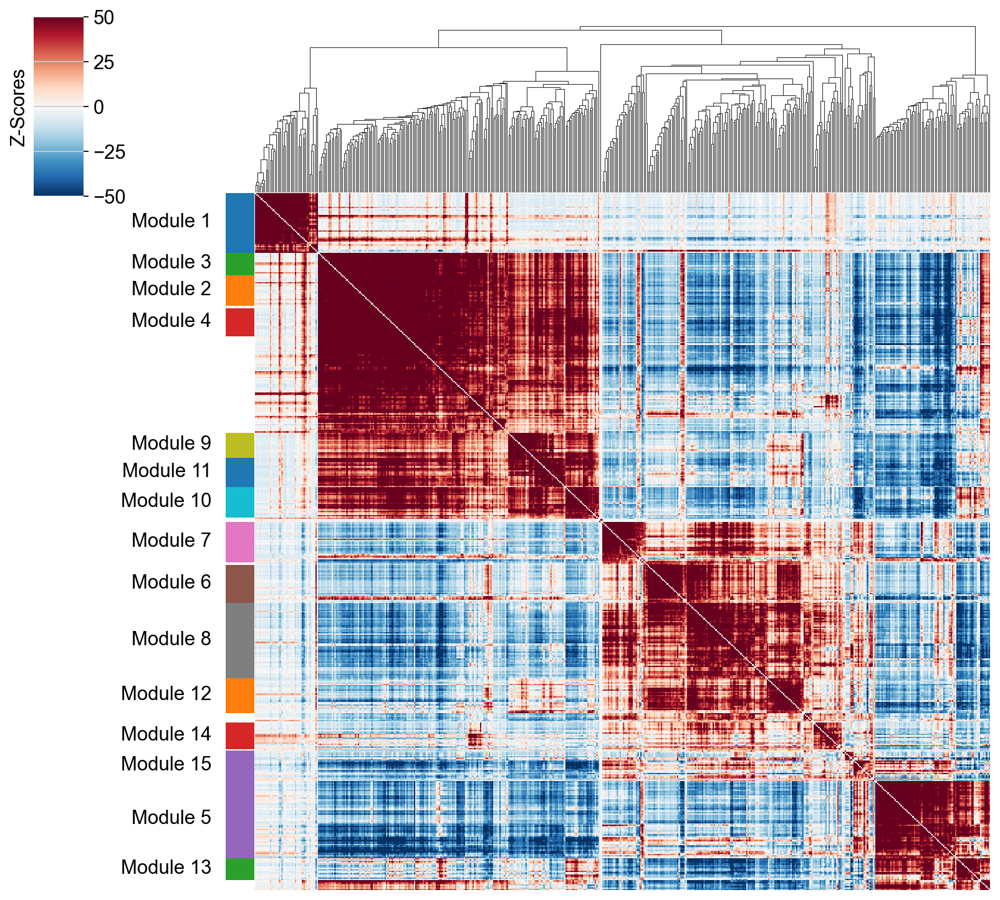

In [46]:
hs.plot_local_correlations(vmin=-50, vmax=50)
plt.savefig(figure_dir + "hotspot_local_correlations_fast_cycling_invasive.pdf")

In [47]:
results = hs.results.join(hs.modules)
# order by module
results = results.sort_values("Module")
# save results
results.to_csv(results_dir + f"hotspot_{state}_modules.csv")

In [48]:
module_scores = hs.calculate_module_scores()
module_scores.head()

Computing scores for 15 modules...


100%|██████████| 15/15 [00:04<00:00,  3.74it/s]


,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
Gao2021_AAATGCCCATTGGTAC,0.611219,1.108467,0.783694,1.176542,-1.058668,-1.533040,-1.817312,-4.245007,-1.236770,2.570162,-1.192824,-1.827415,3.517463,-1.273024,-3.060490
Gao2021_AACCATGTCACCACCT,3.470568,0.747599,-0.443031,-0.436019,-4.103508,-1.559864,-1.713451,-3.014054,-1.550643,0.664078,-1.595230,-1.243693,-1.997640,-1.586079,-0.511877
Gao2021_AACCATGTCACCAGGC,-0.384878,0.472398,-0.443741,1.762466,-2.608178,-1.897482,-1.728260,-4.304051,6.681237,4.143588,1.658633,-1.233976,1.324557,-2.029184,-3.710733
Gao2021_AAGGAGCTCGAACTGT,2.516553,0.879008,0.057334,-1.029791,-4.217653,-1.798740,-1.311936,-2.837016,-1.620151,-0.004593,-1.794083,-1.470500,-2.047539,-0.937069,-0.462632
Gao2021_AATCGGTTCTCTAGGA,3.395128,2.136275,1.565873,-0.092144,-5.722124,-1.526898,-1.316752,-2.978963,-1.540263,0.481596,-1.472825,-1.173682,-2.969253,-0.817380,-0.834258


In [49]:
sc.tl.umap(adata)

computing UMAP
    finished (0:00:19)


In [50]:
module_cols = []
for c in module_scores.columns:
    key = f"Module {c}"
    adata.obs[key] = module_scores[c]
    module_cols.append(key)

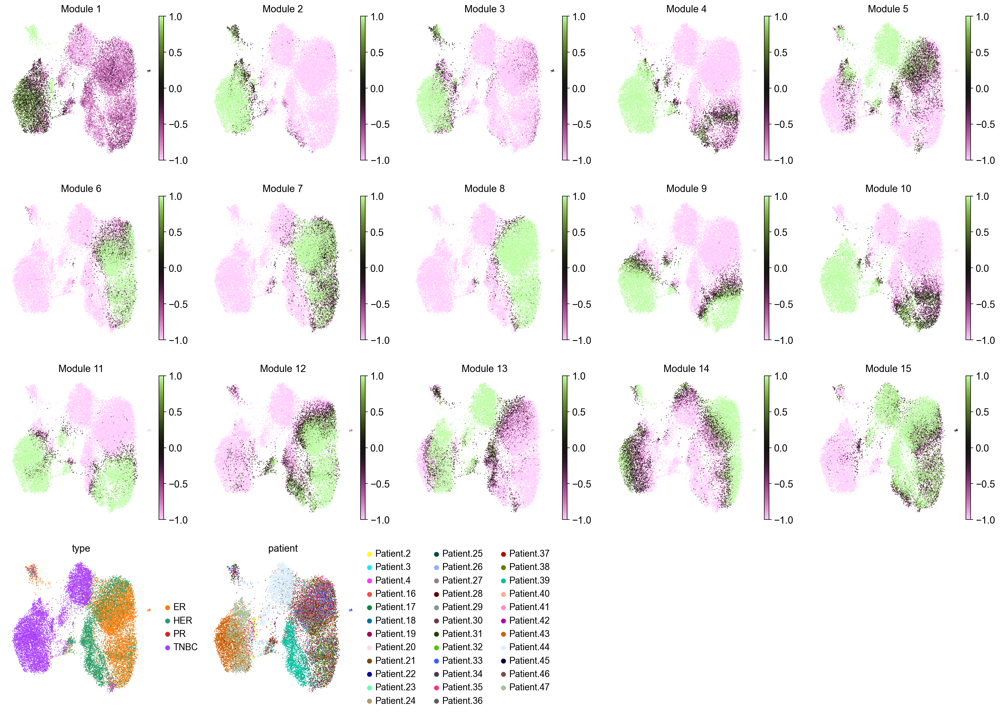

In [51]:
sc.pl.umap(adata, color=module_cols + ["type", "patient"], vmin=-1, vmax=1, cmap="vanimo", ncols=5)

## Slow-cycling

In [52]:
state = "Slow-cycling"

In [53]:
adata = adata_invasive[adata_invasive.obs.cycling_state_oren.isin([state])].copy()

In [54]:
adata.X = adata.layers["counts"].copy()
sc.pp.filter_genes(adata, min_cells=20)

filtered out 1851 genes that are detected in less than 20 cells


In [55]:
sc.pp.normalize_total(adata, target_sum=1e4)
adata.X = np.log1p(adata.X)

normalizing counts per cell
    finished (0:00:00)


In [56]:
sc.pp.highly_variable_genes(adata, batch_key="type", n_top_genes=2000)
sc.pp.pca(adata, use_highly_variable=True)

extracting highly variable genes
    finished (0:00:07)
computing PCA
    with n_comps=50
    finished (0:00:05)


In [57]:
sc.external.pp.harmony_integrate(adata, key=["patient"])

2026-01-12 11:00:02,974 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2026-01-12 11:00:09,308 - harmonypy - INFO - sklearn.KMeans initialization complete.
2026-01-12 11:00:09,536 - harmonypy - INFO - Iteration 1 of 10
2026-01-12 11:00:31,886 - harmonypy - INFO - Iteration 2 of 10
2026-01-12 11:00:55,703 - harmonypy - INFO - Converged after 2 iterations


In [58]:
sc.pp.neighbors(adata, use_rep="X_pca_harmony")

computing neighbors
    finished (0:00:06)


In [59]:
hs = hp.Hotspot(
    adata,
    distances_obsp_key="distances",
    layer_key="counts",
    umi_counts_obs_key="nCount_RNA",
)

In [60]:
hs.create_knn_graph(
    weighted_graph=False,
    n_neighbors=30,
)

In [61]:
hs_results = hs.compute_autocorrelations(jobs=32)

100%|██████████| 22048/22048 [57:15<00:00,  6.42it/s]


In [62]:
hs_results.head(15)

,C,Z,Pval,FDR
Gene,,,,
DDIT4,0.646651,1025.207886,0.0,0.0
SCGB1D2,0.565535,936.055359,0.0,0.0
LINC01238,0.576018,904.049683,0.0,0.0
CXCL14,0.542062,893.203003,0.0,0.0
TMEM190,0.470448,885.615295,0.0,0.0
APOE,0.518022,808.170410,0.0,0.0
C20orf85,0.528532,801.336121,0.0,0.0
PCLAF,0.633024,778.915894,0.0,0.0
ID1,0.491183,767.342346,0.0,0.0


In [63]:
# Select the genes with significant lineage autocorrelation
hs_genes = (
    hs_results.loc[hs_results.FDR < 0.05]
    .sort_values("Z", ascending=False)
    .head(500)
    .index
)

# Compute pair-wise local correlations between these genes
lcz = hs.compute_local_correlations(hs_genes, jobs=10)

Computing pair-wise local correlation on 500 features...


100%|██████████| 124750/124750 [00:59<00:00, 2093.43it/s]


In [64]:
modules = hs.create_modules(min_gene_threshold=15, core_only=True, fdr_threshold=0.05)
modules.value_counts()

Module
-1     90
 3     68
 2     60
 4     41
 5     40
 11    37
 6     31
 8     29
 1     22
 9     22
 10    22
 12    21
 7     17
Name: count, dtype: int64

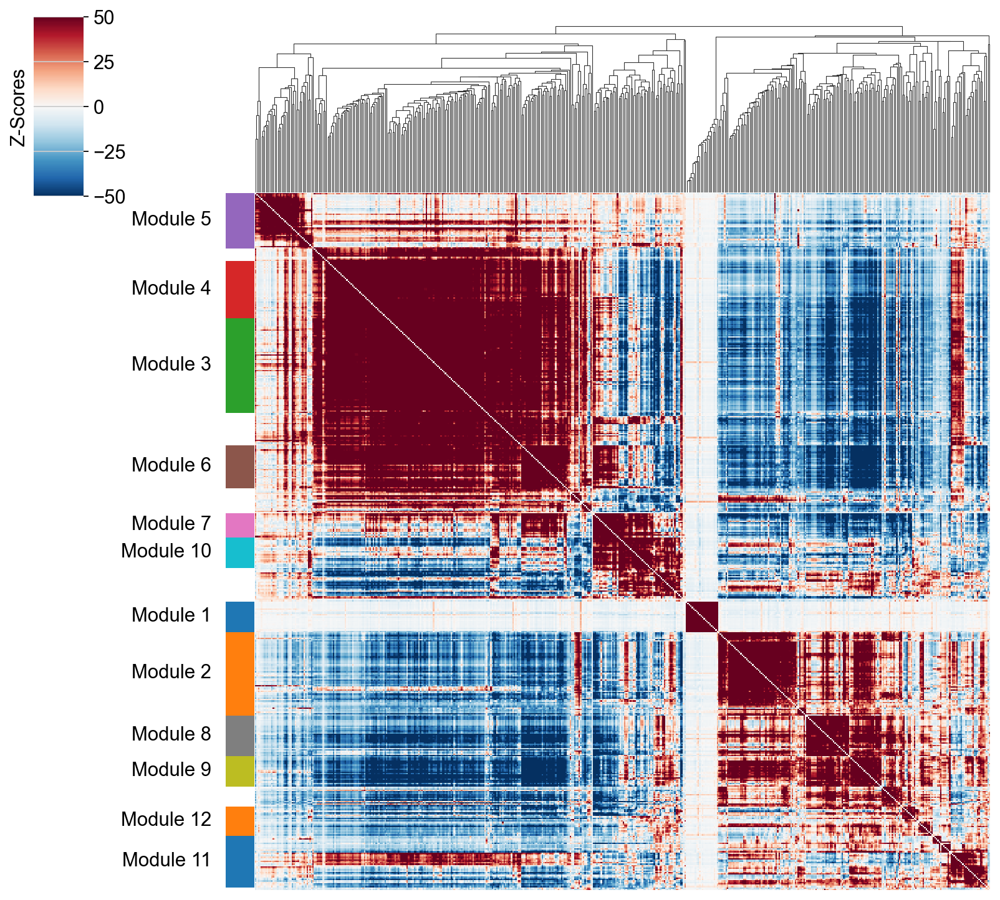

In [65]:
hs.plot_local_correlations(vmin=-50, vmax=50)
plt.savefig(figure_dir + "hotspot_local_correlations_slow_cycling_invasive.pdf")

In [66]:
results = hs.results.join(hs.modules)
# order by module
results = results.sort_values("Module")
# save results
results.to_csv(results_dir + f"hotspot_{state}_modules.csv")

In [67]:
module_scores = hs.calculate_module_scores()
module_scores.head()

Computing scores for 12 modules...


100%|██████████| 12/12 [00:06<00:00,  1.86it/s]


,1,2,3,4,5,6,7,8,9,10,11,12
Gao2021_AAACGGGTCCAGAGGA,0.106549,-2.608204,5.256705,-0.621780,1.645060,0.967874,-2.099190,-1.851645,-3.517453,-4.483275,-0.752251,0.098038
Gao2021_AAAGTAGTCTATCCCG,0.348848,-2.760007,1.329096,-0.410123,2.577009,0.813507,-2.514113,-1.692661,-3.618015,-5.063918,-1.747748,0.076060
Gao2021_AAATGCCAGTACGTTC,0.305291,-2.803805,1.530721,-0.676751,4.168869,0.791438,-2.391390,-1.594811,-3.644263,-4.990273,-2.088213,0.173887
Gao2021_AAATGCCGTTGGTTTG,-0.014969,-2.745070,7.685456,1.281703,2.354183,2.285545,-1.645409,-2.052823,-3.618990,-4.356915,-0.420868,-0.286904
Gao2021_AACACGTTCTTAGAGC,0.384633,-2.571944,1.510854,-0.986653,2.690629,0.693824,-2.463747,-1.257873,-3.590748,-5.114994,-1.937245,-0.062844


In [69]:
sc.tl.umap(adata)

computing UMAP
    finished (0:00:48)


In [70]:
module_cols = []
for c in module_scores.columns:
    key = f"Module {c}"
    adata.obs[key] = module_scores[c]
    module_cols.append(key)

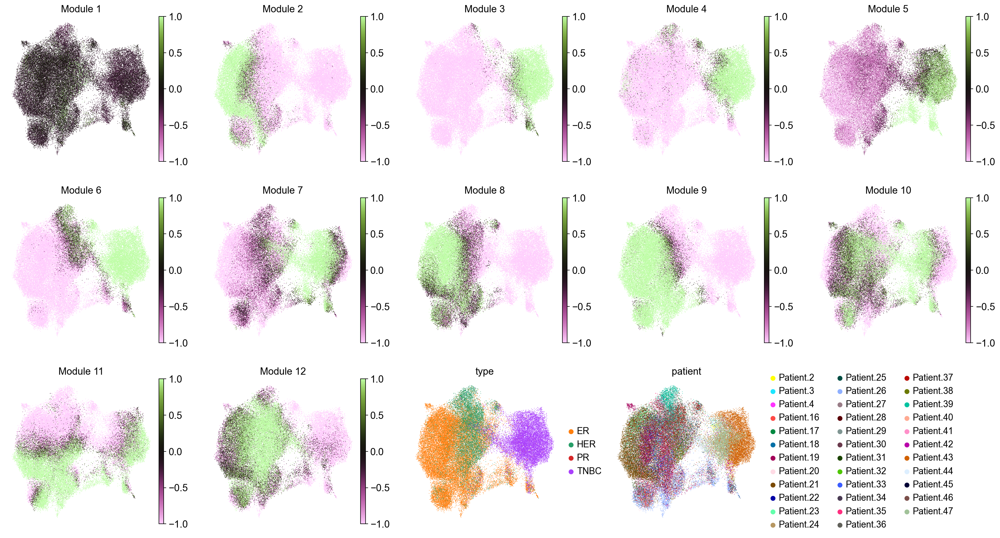

In [71]:
sc.pl.umap(adata, color=module_cols + ["type", "patient"], vmin=-1, vmax=1, cmap="vanimo", ncols=5)